In [1]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt, seaborn as sns


In [2]:
housing = pd.read_csv('Housing.csv')
housing.head()

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnishingstatus
0,13300000,7420,4,2,3,yes,no,no,no,yes,2,yes,furnished
1,12250000,8960,4,4,4,yes,no,no,no,yes,3,no,furnished
2,12250000,9960,3,2,2,yes,no,yes,no,no,2,yes,semi-furnished
3,12215000,7500,4,2,2,yes,no,yes,no,yes,3,yes,furnished
4,11410000,7420,4,1,2,yes,yes,yes,no,yes,2,no,furnished


In [3]:
housing.columns

Index(['price', 'area', 'bedrooms', 'bathrooms', 'stories', 'mainroad',
       'guestroom', 'basement', 'hotwaterheating', 'airconditioning',
       'parking', 'prefarea', 'furnishingstatus'],
      dtype='object')

In [4]:
varlist = ['mainroad','guestroom', 'basement', 'hotwaterheating', 'airconditioning', 'prefarea',]
def binary_map(x):
  return x.map({'yes':1,'no':0})
housing[varlist] =  housing[varlist].apply(binary_map)

In [5]:
housing.head()

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnishingstatus
0,13300000,7420,4,2,3,1,0,0,0,1,2,1,furnished
1,12250000,8960,4,4,4,1,0,0,0,1,3,0,furnished
2,12250000,9960,3,2,2,1,0,1,0,0,2,1,semi-furnished
3,12215000,7500,4,2,2,1,0,1,0,1,3,1,furnished
4,11410000,7420,4,1,2,1,1,1,0,1,2,0,furnished


In [6]:
status = pd.get_dummies(housing['furnishingstatus']).astype(int)
status.head()

,furnished,semi-furnished,unfurnished
0,1,0,0
1,1,0,0
2,0,1,0
3,1,0,0
4,1,0,0


In [7]:
housing = pd.concat([housing, status], axis =1)
housing.drop(['furnishingstatus'], axis =1, inplace = True)
housing.head()

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnished,semi-furnished,unfurnished
0,13300000,7420,4,2,3,1,0,0,0,1,2,1,1,0,0
1,12250000,8960,4,4,4,1,0,0,0,1,3,0,1,0,0
2,12250000,9960,3,2,2,1,0,1,0,0,2,1,0,1,0
3,12215000,7500,4,2,2,1,0,1,0,1,3,1,1,0,0
4,11410000,7420,4,1,2,1,1,1,0,1,2,0,1,0,0


In [8]:
from sklearn.model_selection import train_test_split
X = housing.drop(['price'], axis =1)
y = housing['price']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state =50)

In [9]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((436, 14), (109, 14), (436,), (109,))

In [10]:
X_train.head()

,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnished,semi-furnished,unfurnished
271,1905,5,1,2,0,0,1,0,0,0,0,0,1,0
355,8250,3,1,1,1,0,0,0,0,2,0,1,0,0
151,4400,4,1,2,1,0,0,0,1,2,1,0,1,0
29,5500,4,2,2,1,0,1,0,1,1,1,0,1,0
534,3000,4,1,2,1,0,0,0,0,0,0,0,0,1


In [11]:
y_train.head()

,price
271,4340000
355,3773000
151,5565000
29,8400000
534,2100000


In [12]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=42, max_depth=3,min_samples_leaf=10) # Pre-Pruning
dt.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3, min_samples_leaf=10, random_state=42)

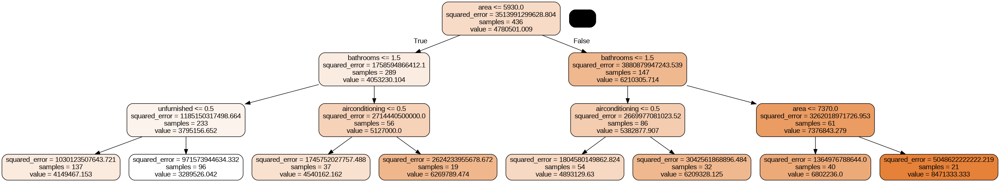

In [13]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

dot_data = StringIO()
export_graphviz(dt,out_file = dot_data, filled = True, rounded = True, feature_names=X.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [14]:
y_train_pred = dt.predict(X_train)

In [15]:
from sklearn import metrics
metrics.r2_score(y_train, y_train_pred)

0.5403167935913948

In [16]:
y_test_pred = dt.predict(X_test)

In [17]:
metrics.r2_score(y_test, y_test_pred)

0.5371421879133778

In [18]:
def get_dt_graph(dt_regressor):
  dot_data = StringIO()
  export_graphviz(dt_regressor,out_file = dot_data, filled = True, rounded = True, feature_names=X.columns)
  graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
  return graph


In [19]:
def evaluate_model(dt_regressor):
  print('Train Evaluation Metrics:', metrics.r2_score(y_train,dt_regressor.predict(X_train)))
  print('Testing Evaluation Metrics', metrics.r2_score(y_test,dt_regressor.predict(X_test)))

In [20]:
dt_default = DecisionTreeRegressor(random_state =42)
dt_default.fit(X_train , y_train)

DecisionTreeRegressor(random_state=42)

In [21]:
gph = get_dt_graph(dt_default)
Image(gph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.869036 to fit



In [22]:
evaluate_model(dt_default)

Train Evaluation Metrics: 0.9987201346285941
Testing Evaluation Metrics 0.2268387567824114


In [23]:
dt_max_depth = DecisionTreeRegressor(max_depth =3)
dt_max_depth.fit(X_train , y_train)

DecisionTreeRegressor(max_depth=3)

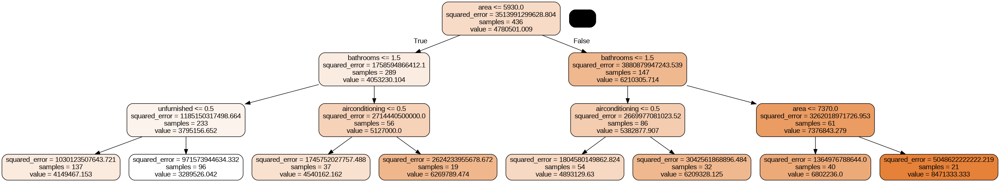

In [24]:
gph = get_dt_graph(dt_max_depth)
Image(gph.create_png())

In [25]:
evaluate_model(dt_max_depth)

Train Evaluation Metrics: 0.5403167935913948
Testing Evaluation Metrics 0.5371421879133778


In [26]:
dt_min_split = DecisionTreeRegressor(min_samples_split= 10)
dt_min_split.fit(X_train , y_train)

DecisionTreeRegressor(min_samples_split=10)

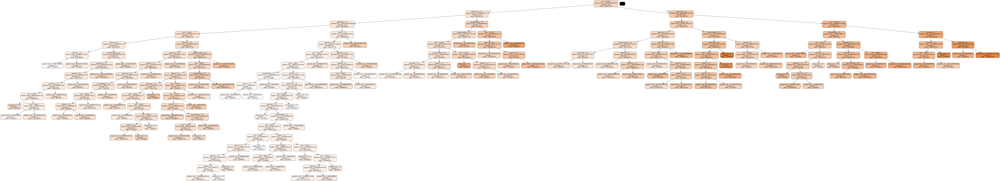

In [27]:
gph = get_dt_graph(dt_min_split)
Image(gph.create_png())

In [28]:
evaluate_model(dt_min_split)

Train Evaluation Metrics: 0.8479560416361167
Testing Evaluation Metrics 0.37113726618239207


In [29]:
dt_min_leaf = DecisionTreeRegressor(min_samples_leaf= 10, random_state = 50)
dt_min_leaf.fit(X_train , y_train)

DecisionTreeRegressor(min_samples_leaf=10, random_state=50)

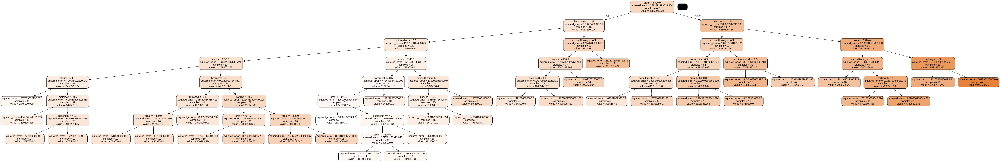

In [30]:
gph = get_dt_graph(dt_min_leaf)
Image(gph.create_png())

In [31]:
evaluate_model(dt_min_leaf)

Train Evaluation Metrics: 0.6590638802032365
Testing Evaluation Metrics 0.5775187843688794


In [32]:

# Post Pruning

dt = DecisionTreeRegressor(random_state=40)
params = {'max_depth':[2,3,4,5,10,11,12,13,14,15,20],
          'min_samples_leaf':[5,10,15,20,25,30,35,40],
          'criterion':['squared_error','absolute_error','friedman_mse','poisson']}


In [33]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator=dt,
                           param_grid=params,
                           cv = 5,
                           n_jobs=-1,
                           verbose=1,
                           scoring = 'r2')
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 352 candidates, totalling 1760 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=40), n_jobs=-1,
             param_grid={'criterion': ['squared_error', 'absolute_error',
                                       'friedman_mse', 'poisson'],
                         'max_depth': [2, 3, 4, 5, 10, 11, 12, 13, 14, 15, 20],
                         'min_samples_leaf': [5, 10, 15, 20, 25, 30, 35, 40]},
             scoring='r2', verbose=1)

In [34]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.005887,0.000899,0.004056,0.000734,squared_error,2,5,"{'criterion': 'squared_error', 'max_depth': 2,...",0.454803,0.244044,0.368223,0.453227,0.374278,0.378915,0.076951,290
1,0.005321,0.000953,0.003154,0.000242,squared_error,2,10,"{'criterion': 'squared_error', 'max_depth': 2,...",0.454803,0.244044,0.368223,0.453227,0.374278,0.378915,0.076951,290
2,0.004728,0.000242,0.003529,0.001100,squared_error,2,15,"{'criterion': 'squared_error', 'max_depth': 2,...",0.454803,0.244044,0.368223,0.453227,0.374278,0.378915,0.076951,290
3,0.005220,0.001154,0.003506,0.001032,squared_error,2,20,"{'criterion': 'squared_error', 'max_depth': 2,...",0.454803,0.244044,0.368223,0.453227,0.374278,0.378915,0.076951,290
4,0.004915,0.000381,0.003585,0.000657,squared_error,2,25,"{'criterion': 'squared_error', 'max_depth': 2,...",0.454803,0.244044,0.368223,0.453227,0.374278,0.378915,0.076951,290


In [35]:
grid_search.best_estimator_

DecisionTreeRegressor(criterion='poisson', max_depth=10, min_samples_leaf=15,
                      random_state=40)

In [36]:
dt_best = grid_search.best_estimator_

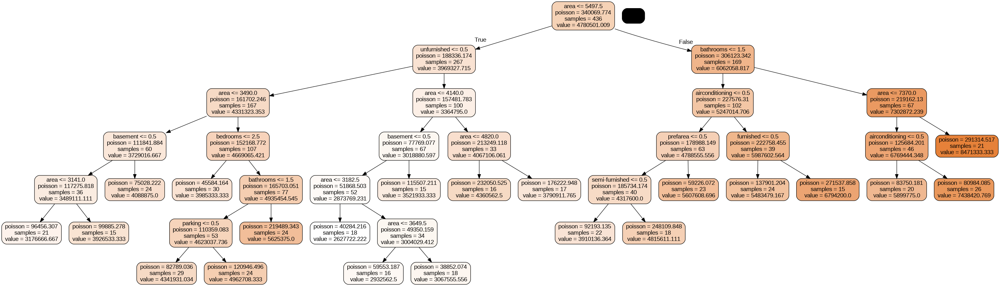

In [37]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

In [38]:
evaluate_model(dt_best)

Train Evaluation Metrics: 0.6219717681093724
Testing Evaluation Metrics 0.5382519875142525


In [39]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=40,n_jobs=-1,max_depth=10,min_samples_leaf=15)
rf.fit(X_train,y_train)



RandomForestRegressor(max_depth=10, min_samples_leaf=15, n_jobs=-1,
                      random_state=40)

In [40]:
sample_tree = rf.estimators_[20]
sample_tree

DecisionTreeRegressor(max_depth=10, max_features=1.0, min_samples_leaf=15,
                      random_state=2065616689)

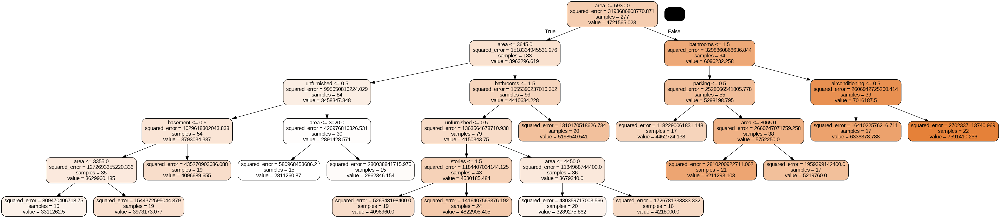

In [41]:
gph = get_dt_graph(sample_tree)
Image(gph.create_png())

In [42]:
evaluate_model(sample_tree)

Train Evaluation Metrics: 0.5305436706093343
Testing Evaluation Metrics 0.5775941517434048


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(


In [43]:
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)
metrics.r2_score(y_train, y_train_pred), metrics.r2_score(y_test, y_test_pred)

(0.6298828546201884, 0.6563707147734517)

In [44]:
rf.feature_importances_

array([0.56211471, 0.00712083, 0.22541017, 0.02060369, 0.00287577,
       0.        , 0.02192082, 0.        , 0.06257651, 0.02488497,
       0.0181468 , 0.00068807, 0.00517738, 0.04848027])

In [45]:
imp_df = pd.DataFrame({'Varname':X_train.columns, 'Imp':rf.feature_importances_})
imp_df.sort_values(by='Imp', ascending = False)

,Varname,Imp
0,area,0.562115
2,bathrooms,0.225410
8,airconditioning,0.062577
13,unfurnished,0.048480
9,parking,0.024885
6,basement,0.021921
3,stories,0.020604
10,prefarea,0.018147
1,bedrooms,0.007121
12,semi-furnished,0.005177
